In [1]:
import argparse
import os



parser = argparse.ArgumentParser()
parser.add_argument('--EXP_NAME', type=str, default='')

parser.add_argument('--RESUME', default=False, action='store_true', help="resume previous training")
parser.add_argument('--RESUME_PATH',type=str, default='')
parser.add_argument('--PRETRAIN', default=False, action='store_true', help="resume previous training")
parser.add_argument('--PRETRAIN_PATH',type=str, default='')
parser.add_argument('--FROZEN', default=False, action='store_true', help="frozen pretrained frontend weights")


parser.add_argument('--GPU_ID', type=str, default='0')
parser.add_argument('--SEED', type=int, default=3035)
parser.add_argument('--DATASET', type=str, default='HT21')
parser.add_argument('--task', type=str, default='FT')
parser.add_argument('--PRINT_FREQ', type=int, default=20)
parser.add_argument('--SAVE_VIS_FREQ', type=int, default=800)




parser.add_argument('--LR_MIN', type=float, default=1e-6)
# parser.add_argument('--LR_MAX', type=float, default=1e-4)
parser.add_argument('--LR_Base', type=float, default=5e-5, help='density branch')
parser.add_argument('--LR_Thre', type=float, default=1e-4, help='mask branch')
parser.add_argument('--LR_DECAY', type=float, default=0.95)
parser.add_argument('--WEIGHT_DECAY', type=float, default=1e-5)
parser.add_argument('--WARMUP_EPOCH', type=int, default=3, help='number of epochs for warm up step in cosine annealing lr scheduler')
parser.add_argument('--MAX_EPOCH', type=int, default=20)
parser.add_argument('--worker', type=int, default=16)


parser.add_argument('--con_alpha', type=float, default=0.01)
parser.add_argument('--con_scale', type=int, default=1)
parser.add_argument('--intra_loss', default=False, action='store_true', help="intra loss")
parser.add_argument('--intra_loss_alpha', type=float, default=0.1)



parser.add_argument('--warp_alpha', type=float, default=0)
parser.add_argument('--scale_mask_alpha', type=float, default=0)





#_test or val
parser.add_argument('--VAL_FREQ', type=int, default=1000)
parser.add_argument('--VAL_START', type=int, default=14000)

# parser.add_argument('--VAL_INTERVALS', type=int, default=75)
# parser.add_argument('--ADJ_SCALES', type=int, nargs='+', default=[1])
parser.add_argument('--VAL_BATCH_SIZE', type=int, default=1)
parser.add_argument('--mask_threshold', type=float, default=0.5)



#_train
parser.add_argument('--TRAIN_SIZE', type=int, nargs='+', default=[768,1024])
parser.add_argument('--GRID_SIZE', type=int, default=8)
parser.add_argument('--TRAIN_FRAME_INTERVALS', type=int, nargs='+', default=[40, 85])
parser.add_argument('--TRAIN_BATCH_SIZE', type=int, default=1)
parser.add_argument('--alpha', type=float, default=0.5)
parser.add_argument('--ROI_RADIUS', type=float, default=4.)
# parser.add_argument('--map_scale', type=float, default=1/4)
parser.add_argument('--target_ratio', type=float, default=2)
parser.add_argument('--gaussian_sigma', type=float, default=4)


#_shift pretrain
parser.add_argument('--WIN_OFFSET_RANGE', type=int, nargs='+', default=[100,350])
parser.add_argument('--IMG_OFFSET_RANGE', type=int, nargs='+', default=[-100,100])


parser.add_argument('--DEN_FACTOR', type=float, default=200.)
parser.add_argument('--MEAN_STD', type=tuple, default=([117/255., 110/255., 105/255.], [67.10/255., 65.45/255., 66.23/255.]))

cfg = parser.parse_known_args()[0]






cfg.mode = 'train'

cfg.feature_scale = 0.25

if cfg.DATASET == "SENSE":
    cfg.MEAN_STD = ([117/255., 110/255., 105/255.], [67.10/255., 65.45/255., 66.23/255.])
    cfg.TRAIN_FRAME_INTERVALS = [5,12]

cfg.VAL_INTERVALS = (cfg.TRAIN_FRAME_INTERVALS[0]+cfg.TRAIN_FRAME_INTERVALS[1])//2


print(cfg)


Namespace(DATASET='HT21', DEN_FACTOR=200.0, EXP_NAME='', FROZEN=False, GPU_ID='0', GRID_SIZE=8, IMG_OFFSET_RANGE=[-100, 100], LR_Base=5e-05, LR_DECAY=0.95, LR_MIN=1e-06, LR_Thre=0.0001, MAX_EPOCH=20, MEAN_STD=([0.4588235294117647, 0.43137254901960786, 0.4117647058823529], [0.26313725490196077, 0.25666666666666665, 0.25972549019607843]), PRETRAIN=False, PRETRAIN_PATH='', PRINT_FREQ=20, RESUME=False, RESUME_PATH='', ROI_RADIUS=4.0, SAVE_VIS_FREQ=800, SEED=3035, TRAIN_BATCH_SIZE=1, TRAIN_FRAME_INTERVALS=[40, 85], TRAIN_SIZE=[768, 1024], VAL_BATCH_SIZE=1, VAL_FREQ=1000, VAL_INTERVALS=62, VAL_START=14000, WARMUP_EPOCH=3, WEIGHT_DECAY=1e-05, WIN_OFFSET_RANGE=[100, 350], alpha=0.5, con_alpha=0.01, con_scale=1, feature_scale=0.25, gaussian_sigma=4, intra_loss=False, intra_loss_alpha=0.1, mask_threshold=0.5, mode='train', scale_mask_alpha=0, target_ratio=2, task='FT', warp_alpha=0, worker=16)


In [2]:
from  torchvision import models
# import sys
import torch.nn.functional as F
# from misc.utils import *
# from misc.layer import *
# from torchsummary import summary
# from model.necks import FPN
# from .conv import ResBlock, BasicConv
import torch.nn as nn

# from model.attention import MultiScaleFeatureFusion

BatchNorm2d = nn.BatchNorm2d
BN_MOMENTUM = 0.01


vgg = models.vgg16_bn(weights='VGG16_BN_Weights.IMAGENET1K_V1')
features = list(vgg.features.children())
# print(nn.Sequential(*features[:]))
layer1 = nn.Sequential(*features[0:23])
layer2 = nn.Sequential(*features[23:33])
layer3 = nn.Sequential(*features[33:43])
print(layer1)
print(layer2)
print(layer3)


/nfs/home/leo0511/Research/research_env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (9): ReLU(inplace=True)
  (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (12): ReLU(inplace=True)
  (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (14): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 

In [3]:
import cv2
import PIL.Image as Image
import sys
sys.path.append('..')
from datasets import *
from misc.flow_viz import *

import torchvision.transforms as standard_transforms


def save_results_mask(cfg, exp_path, exp_name, scene_name, iter, restore, batch, img0, img1, pred_map0, gt_map0,\
                        pred_map1, gt_map1, pred_mask_out, gt_mask_out, pred_mask_in, gt_mask_in, f_flow,b_flow, attn_1,attn_2):
                        #attn_ref, attn_sou): 



    UNIT_H , UNIT_W = img0.size(2), img0.size(3)
    for idx, tensor in enumerate(zip(img0.cpu().data, img1.cpu().data,pred_map0, gt_map0, pred_map1, gt_map1, \
                                     pred_mask_out, gt_mask_out, pred_mask_in, gt_mask_in, attn_1, attn_2)):
        if idx > 1:  # show only one group
            break

        f_flow_map = []
        b_flow_map = []
        # attn_1_map = []
        # attn_2_map = []
        feature_1_map = []
        align_feature_2_map = []
        feature_2_map = []
        align_feature_1_map = []

        pil_input0 = restore(tensor[0])
        pil_input1 = restore(tensor[1])

        for i in range(len(f_flow)):
            f = f_flow[i][batch].permute(1,2,0).detach().cpu().numpy()
            b = b_flow[i][batch].permute(1,2,0).detach().cpu().numpy()
            f = point_vec(np.array(pil_input0),f,10, 3)
            b = point_vec(np.array(pil_input1),b,10, 3)
            # f = flow_to_image(f)
            # b = flow_to_image(b)


            f_flow_map.append(f)
            b_flow_map.append(b)
            # print(attn_1[i][0][0].shape)
        
        for i in range(len(attn_1)):

            a1 = np.max(attn_1[i][0][batch].detach().cpu().numpy(), axis=0)
            a2 = np.max(attn_2[i][0][batch].detach().cpu().numpy(), axis=0)
            a1 = cv2.resize(a1[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
            a2 = cv2.resize(a2[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
            a1 = cv2.applyColorMap((255 * a1 / (a1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)
            a2 = cv2.applyColorMap((255 * a2 / (a2.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)

            a3 = np.max(attn_1[i][1][batch].detach().cpu().numpy(), axis=0)
            a4 = np.max(attn_2[i][1][batch].detach().cpu().numpy(), axis=0)
            a3 = cv2.resize(a3[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
            a4 = cv2.resize(a4[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
            a3 = cv2.applyColorMap((255 * a3 / (a3.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)
            a4 = cv2.applyColorMap((255 * a4 / (a4.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)

            a1 = cv2.cvtColor(a1, cv2.COLOR_BGR2GRAY)
            a2 = cv2.cvtColor(a2, cv2.COLOR_BGR2GRAY)
            a3 = cv2.cvtColor(a3, cv2.COLOR_BGR2GRAY)
            a4 = cv2.cvtColor(a4, cv2.COLOR_BGR2GRAY)
            
            
            # attn_1_map.append(a1)
            # attn_2_map.append(a2)
            feature_1_map.append(a1)
            align_feature_2_map.append(a3)
            feature_2_map.append(a2)
            align_feature_1_map.append(a4)


       
        # ratio = UNIT_H/tensor[2].shape[0]
        pred_color_map0 = cv2.resize(cv2.applyColorMap((255 * tensor[2] / (tensor[2].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
        gt_color_map0 = cv2.resize(cv2.applyColorMap((255 * tensor[3] / (tensor[3].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
        pred_color_map1 = cv2.resize(cv2.applyColorMap((255 * tensor[4] / (tensor[4].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
        gt_color_map1 = cv2.resize(cv2.applyColorMap((255 * tensor[5] / (tensor[5].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
        pred_out_color = cv2.resize(cv2.applyColorMap((255 * tensor[6] / (tensor[6].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
        gt_out_color = cv2.resize(cv2.applyColorMap((255 * tensor[7]/ (tensor[7].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
        pred_in_color = cv2.resize(cv2.applyColorMap((255 * tensor[8] / (tensor[8].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
        gt_in_color = cv2.resize(cv2.applyColorMap((255 * tensor[9]/ (tensor[9].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))

       
        
        pil_input0 = np.array(pil_input0)
        pil_input1 = np.array(pil_input1)


        # for i in range(3):
        for i in range(len(f_flow_map)):


            # f_flow_map[i] = cv2.addWeighted(pil_input0, 0.5, f_flow_map[i], 0.5, 0)
            f_flow_map[i] = Image.fromarray(f_flow_map[i])
            # b_flow_map[i] = cv2.addWeighted(pil_input1, 0.5, b_flow_map[i], 0.5, 0)
            b_flow_map[i] = Image.fromarray(b_flow_map[i])
            # attn_1_mapromarray(attn_2_map[i])

        for i in range(len(attn_1)):

            feature_1_map[i] = Image.fromarray(feature_1_map[i])
            align_feature_2_map[i] = Image.fromarray(align_feature_2_map[i])
            feature_2_map[i] = Image.fromarray(feature_2_map[i])
            align_feature_1_map[i] = Image.fromarray(align_feature_1_map[i])




      
        pil_input0 = Image.fromarray(pil_input0)
        pil_input1 = Image.fromarray(pil_input1)
        pil_output0 = Image.fromarray(cv2.cvtColor(pred_color_map0, cv2.COLOR_BGR2RGB))
        pil_gt0 = Image.fromarray(cv2.cvtColor(gt_color_map0, cv2.COLOR_BGR2RGB))
        pil_output1 = Image.fromarray(cv2.cvtColor(pred_color_map1, cv2.COLOR_BGR2RGB))
        pil_gt1 = Image.fromarray(cv2.cvtColor(gt_color_map1, cv2.COLOR_BGR2RGB))
        pil_maskout = Image.fromarray(cv2.cvtColor(pred_out_color, cv2.COLOR_BGR2RGB))
        pil_gtmaskout = Image.fromarray(cv2.cvtColor(gt_out_color, cv2.COLOR_BGR2RGB))
        pil_maskin = Image.fromarray(cv2.cvtColor(pred_in_color, cv2.COLOR_BGR2RGB))
        pil_gtmaskin = Image.fromarray(cv2.cvtColor(gt_in_color, cv2.COLOR_BGR2RGB))


        black_map = np.zeros_like(pil_input0)
        black_map = Image.fromarray(black_map)

        

        imgs = [pil_input0,  f_flow_map[0], f_flow_map[1], f_flow_map[2], \
                feature_1_map[0], feature_1_map[1], feature_1_map[2], feature_1_map[3],\
                align_feature_2_map[0], align_feature_2_map[1], align_feature_2_map[2], align_feature_2_map[3],\
                pil_gt0, pil_output0, pil_gtmaskout, pil_maskout, \
                pil_input1, b_flow_map[0], b_flow_map[1], b_flow_map[2], \
                feature_2_map[0], feature_2_map[1], feature_2_map[2], feature_2_map[3], \
                align_feature_1_map[0], align_feature_1_map[1], align_feature_1_map[2],align_feature_1_map[3], \
                pil_gt1, pil_output1, pil_gtmaskin, pil_maskin]

        w_num , h_num = 4, 8
        # w_num , h_num = 5, 4

        

        target_shape = (w_num * (UNIT_W + 10), h_num * (UNIT_H + 10))
        target = Image.new('RGB', target_shape)
        count = 0
        for img in imgs:
            x, y = int(count%w_num) * (UNIT_W + 10), int(count // w_num) * (UNIT_H + 10)  # 左上角坐标，从左到右递增
            target.paste(img, (x, y, x + UNIT_W, y + UNIT_H))
            count+=1


      

        target.resize((w_num*50, h_num*50))
        # target.save(os.path.join(dir,f'{iter}_{batch}_den.jpg'.format()))
        target.show()

In [4]:
# import cv2
# import PIL.Image as Image
# import sys
# sys.path.append('..')
# from datasets import *
# from misc.flow_viz import *

# import torchvision.transforms as standard_transforms

# def save_results_mask(cfg, exp_path, exp_name, scene_name, iter, restore, batch, img0, img1, pred_map0, gt_map0,\
#                         pred_map1, gt_map1, f_flow,b_flow, attn_1,attn_2,den_scales, gt_den_scales, mask, gt_mask):

#     pil_to_tensor = standard_transforms.ToTensor()

#     UNIT_H , UNIT_W = img0.size(2), img0.size(3)
#     # for idx, tensor in enumerate(zip(img0.cpu().data, img1.cpu().data,pred_map0, gt_map0, pred_map1, gt_map1, \
#     #                                  pred_mask_out, gt_mask_out, pred_mask_in, gt_mask_in, attn_1, attn_2)):
#     for idx, tensor in enumerate(zip(img0.cpu().data, img1.cpu().data,pred_map0, gt_map0, pred_map1, gt_map1, \
#                                       attn_1, attn_2)):
#         if idx > 1:  # show only one group
#             break

#         f_flow_map = []
#         b_flow_map = []
#         # attn_1_map = []
#         # attn_2_map = []
#         feature_1_map = []
#         align_feature_2_map = []
#         feature_2_map = []
#         align_feature_1_map = []
#         den_scales_1_map = []
#         gt_den_scales_1_map = []
#         den_scales_2_map = []
#         gt_den_scales_2_map = []
#         mask_in_scales_1_map = []
#         gt_mask_in_scales_1_map = []
#         mask_out_scales_1_map = []
#         gt_mask_out_scales_1_map = []



#         pil_input0 = restore(tensor[0])
#         pil_input1 = restore(tensor[1])

#         for i in range(len(f_flow)):
#             f = f_flow[i][batch].permute(1,2,0).detach().cpu().numpy()
#             b = b_flow[i][batch].permute(1,2,0).detach().cpu().numpy()
#             # f_flow_map.append(flow_to_image(f))
#             # b_flow_map.append(flow_to_image(b))
#             f = point_vec(np.array(pil_input1),f,10, 3)
#             b = point_vec(np.array(pil_input0),b,10, 3)
#             # f = flow_to_image(f)
#             # b = flow_to_image(b)


#             f_flow_map.append(f)
#             b_flow_map.append(b)
#             # print(attn_1[i][0][0].shape)
#         for i in range(len(attn_1)):

#             a1 = np.max(attn_1[i][0][batch].detach().cpu().numpy(), axis=0)
#             a2 = np.max(attn_2[i][0][batch].detach().cpu().numpy(), axis=0)
#             a1 = cv2.resize(a1[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
#             a2 = cv2.resize(a2[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
#             a1 = cv2.applyColorMap((255 * a1 / (a1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)
#             a2 = cv2.applyColorMap((255 * a2 / (a2.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)

#             a3 = np.max(attn_1[i][1][batch].detach().cpu().numpy(), axis=0)
#             a4 = np.max(attn_2[i][1][batch].detach().cpu().numpy(), axis=0)
#             a3 = cv2.resize(a3[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
#             a4 = cv2.resize(a4[None,:].transpose(1,2,0), (UNIT_W, UNIT_H))
#             a3 = cv2.applyColorMap((255 * a3 / (a3.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)
#             a4 = cv2.applyColorMap((255 * a4 / (a4.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET)

#             a1 = cv2.cvtColor(a1, cv2.COLOR_BGR2GRAY)
#             a2=cv2.cvtColor(a2, cv2.COLOR_BGR2GRAY)
#             a3=cv2.cvtColor(a3, cv2.COLOR_BGR2GRAY)
#             a4=cv2.cvtColor(a4, cv2.COLOR_BGR2GRAY)
            
            
#             # attn_1_map.append(a1)
#             # attn_2_map.append(a2)
#             feature_1_map.append(a1)
#             align_feature_2_map.append(a3)
#             feature_2_map.append(a2)
#             align_feature_1_map.append(a4)


#         for i in range(len(den_scales)):
#             den_scale_1 = den_scales[i][0].detach().cpu().numpy()
#             den_scale_2 = den_scales[i][1].detach().cpu().numpy()
#             gt_den_scale_1 = gt_den_scales[i][0].detach().cpu().numpy()
#             gt_den_scale_2 = gt_den_scales[i][1].detach().cpu().numpy()
#             den_scale_1 = cv2.resize(cv2.applyColorMap((255 * den_scale_1 / (den_scale_1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#             den_scale_2 = cv2.resize(cv2.applyColorMap((255 * den_scale_2 / (den_scale_2.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#             gt_den_scale_1 = cv2.resize(cv2.applyColorMap((255 * gt_den_scale_1 / (gt_den_scale_1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#             gt_den_scale_2 = cv2.resize(cv2.applyColorMap((255 * gt_den_scale_2 / (gt_den_scale_2.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#             den_scale_1 = cv2.cvtColor(den_scale_1, cv2.COLOR_BGR2RGB)
#             den_scale_2 = cv2.cvtColor(den_scale_2, cv2.COLOR_BGR2RGB)
#             gt_den_scale_1 = cv2.cvtColor(gt_den_scale_1, cv2.COLOR_BGR2RGB)
#             gt_den_scale_2 = cv2.cvtColor(gt_den_scale_2, cv2.COLOR_BGR2RGB)

#             den_scales_1_map.append(den_scale_1)
#             den_scales_2_map.append(den_scale_2)
#             gt_den_scales_1_map.append(gt_den_scale_1)
#             gt_den_scales_2_map.append(gt_den_scale_2)


#             ########## mask ###############
#             mask_out_scale_1 = mask[i][0,:,:,:].detach().cpu().numpy()
#             mask_in_scale_1 =  mask[i][1,:,:,:].detach().cpu().numpy()

#             gt_mask_out_scale_1 = gt_mask[i][0,0:1,:,:].detach().cpu().numpy()
#             gt_mask_in_scale_1 = gt_mask[i][0,1:2,:,:].detach().cpu().numpy()

#             mask_out_scale_1 = cv2.resize(cv2.applyColorMap((255 * mask_out_scale_1 / (mask_out_scale_1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#             mask_in_scale_1 = cv2.resize(cv2.applyColorMap((255 * mask_in_scale_1 / (mask_in_scale_1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#             gt_mask_out_scale_1 = cv2.resize(cv2.applyColorMap((255 * gt_mask_out_scale_1 / (gt_mask_out_scale_1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#             gt_mask_in_scale_1 = cv2.resize(cv2.applyColorMap((255 * gt_mask_in_scale_1 / (gt_mask_in_scale_1.max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
            
#             mask_out_scale_1 = cv2.cvtColor(mask_out_scale_1, cv2.COLOR_BGR2RGB)
#             mask_in_scale_1 = cv2.cvtColor(mask_in_scale_1, cv2.COLOR_BGR2RGB)
#             gt_mask_out_scale_1 = cv2.cvtColor(gt_mask_out_scale_1, cv2.COLOR_BGR2RGB)
#             gt_mask_in_scale_1 = cv2.cvtColor(gt_mask_in_scale_1, cv2.COLOR_BGR2RGB)
            

#             mask_out_scales_1_map.append(mask_out_scale_1)
#             mask_in_scales_1_map.append(mask_in_scale_1)
#             gt_mask_out_scales_1_map.append(gt_mask_out_scale_1)
#             gt_mask_in_scales_1_map.append(gt_mask_in_scale_1)


       
#         # ratio = UNIT_H/tensor[2].shape[0]
#         pred_color_map0 = cv2.resize(cv2.applyColorMap((255 * tensor[2] / (tensor[2].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#         gt_color_map0 = cv2.resize(cv2.applyColorMap((255 * tensor[3] / (tensor[3].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#         pred_color_map1 = cv2.resize(cv2.applyColorMap((255 * tensor[4] / (tensor[4].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
#         gt_color_map1 = cv2.resize(cv2.applyColorMap((255 * tensor[5] / (tensor[5].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H)) 
#         # pred_out_color = cv2.resize(cv2.applyColorMap((255 * tensor[6] / (tensor[6].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
#         # gt_out_color = cv2.resize(cv2.applyColorMap((255 * tensor[7]/ (tensor[7].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
#         # pred_in_color = cv2.resize(cv2.applyColorMap((255 * tensor[8] / (tensor[8].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))
#         # gt_in_color = cv2.resize(cv2.applyColorMap((255 * tensor[9]/ (tensor[9].max() + 1e-10)).astype(np.uint8).squeeze(), cv2.COLORMAP_JET), (UNIT_W, UNIT_H))

   
        
#         pil_input0 = np.array(pil_input0)
#         pil_input1 = np.array(pil_input1)
#         # pil_input0 = cv2.cvtColor(pil_input0, cv2.COLOR_LAB2RGB)
#         # pil_input1 = cv2.cvtColor(pil_input1, cv2.COLOR_LAB2RGB)


#         # for i in range(3):
#         for i in range(len(f_flow_map)):


#             # f_flow_map[i] = cv2.addWeighted(pil_input0, 0.5, f_flow_map[i], 0.5, 0)
#             f_flow_map[i] = Image.fromarray(f_flow_map[i])
#             # b_flow_map[i] = cv2.addWeighted(pil_input1, 0.5, b_flow_map[i], 0.5, 0)
#             b_flow_map[i] = Image.fromarray(b_flow_map[i])
#             # attn_1_map[i] = cv2.addWeighted(pil_input0, 0.5, attn_1_map[i], 0.5, 0)
#             # attn_1_map[i] = Image.fromarray(attn_1_map[i])
#             # attn_2_map[i] = cv2.addWeighted(pil_input1, 0.5,attn_2_map[i], 0.5, 0)
#             # attn_2_map[i] = Image.fromarray(attn_2_map[i])

#         for i in range(len(attn_1)):

#             feature_1_map[i] = Image.fromarray(feature_1_map[i])
#             align_feature_2_map[i] = Image.fromarray(align_feature_2_map[i])
#             feature_2_map[i] = Image.fromarray(feature_2_map[i])
#             align_feature_1_map[i] = Image.fromarray(align_feature_1_map[i])
#         for i in range(len(den_scales_1_map)):
#             den_scales_1_map[i]= Image.fromarray(den_scales_1_map[i])
#             gt_den_scales_1_map[i]= Image.fromarray(gt_den_scales_1_map[i])
#             den_scales_2_map[i]= Image.fromarray(den_scales_2_map[i])
#             gt_den_scales_2_map[i]= Image.fromarray(gt_den_scales_2_map[i])
            
#             mask_out_scales_1_map[i]= Image.fromarray(mask_out_scales_1_map[i])
#             mask_in_scales_1_map[i]= Image.fromarray(mask_in_scales_1_map[i])
#             gt_mask_out_scales_1_map[i]= Image.fromarray(gt_mask_out_scales_1_map[i])
#             gt_mask_in_scales_1_map[i]= Image.fromarray(gt_mask_in_scales_1_map[i])




#         # for i, box in enumerate(boxes, 0):
#         #     wh_LeftTop = (box[0], box[1])
#         #     wh_RightBottom = (box[2], box[3])
#         #     cv2.rectangle(binar_color_map, wh_LeftTop, wh_RightBottom, point_color, thickness, lineType)
#         #     cv2.rectangle(pil_input, wh_LeftTop, wh_RightBottom, point_color, thickness, lineType)

#         pil_input0 = Image.fromarray(pil_input0)
#         pil_input1 = Image.fromarray(pil_input1)
#         pil_output0 = Image.fromarray(cv2.cvtColor(pred_color_map0, cv2.COLOR_BGR2RGB))
#         pil_gt0 = Image.fromarray(cv2.cvtColor(gt_color_map0, cv2.COLOR_BGR2RGB))
#         pil_output1 = Image.fromarray(cv2.cvtColor(pred_color_map1, cv2.COLOR_BGR2RGB))
#         pil_gt1 = Image.fromarray(cv2.cvtColor(gt_color_map1, cv2.COLOR_BGR2RGB))
#         # pil_maskout = Image.fromarray(cv2.cvtColor(pred_out_color, cv2.COLOR_BGR2RGB))
#         # pil_gtmaskout = Image.fromarray(cv2.cvtColor(gt_out_color, cv2.COLOR_BGR2RGB))
#         # pil_maskin = Image.fromarray(cv2.cvtColor(pred_in_color, cv2.COLOR_BGR2RGB))
#         # pil_gtmaskin = Image.fromarray(cv2.cvtColor(gt_in_color, cv2.COLOR_BGR2RGB))

#         # pil_attn_1 = Image.fromarray(cv2.cvtColor(attn_map_1, cv2.COLOR_BGR2RGB))
#         # pil_attn_2 = Image.fromarray(cv2.cvtColor(attn_map_2, cv2.COLOR_BGR2RGB))

#         black_map = np.zeros_like(pil_input0)
#         black_map = Image.fromarray(black_map)

        

#         # imgs = [pil_input0,  f_flow_map[0], f_flow_map[1], f_flow_map[2], \
#         #         feature_1_map[0], feature_1_map[1], feature_1_map[2], feature_1_map[3],\
#         #         align_feature_2_map[0], align_feature_2_map[1], align_feature_2_map[2], align_feature_2_map[3],\
#         #         den_scales_1_map[2],den_scales_1_map[1],den_scales_1_map[0],black_map,\
#         #         gt_den_scales_1_map[2],gt_den_scales_1_map[1],gt_den_scales_1_map[0],black_map,\
#         #         pil_gt0, pil_output0, pil_gtmaskout, pil_maskout, \
                
                
#         #         pil_input1, b_flow_map[0], b_flow_map[1], b_flow_map[2], \
#         #         feature_2_map[0], feature_2_map[1], feature_2_map[2], feature_2_map[3], \
#         #         align_feature_1_map[0], align_feature_1_map[1], align_feature_1_map[2],align_feature_1_map[3], \
#         #         den_scales_2_map[2],den_scales_2_map[1],den_scales_2_map[0],black_map,\
#         #         gt_den_scales_2_map[2],gt_den_scales_2_map[1],gt_den_scales_2_map[0],black_map,\
#         #         pil_gt1, pil_output1, pil_gtmaskin, pil_maskin]
#         imgs = [pil_input0,  pil_gt0, pil_output0,\
#                 f_flow_map[0], f_flow_map[1], f_flow_map[2], \
#                 feature_1_map[0], feature_1_map[1], feature_1_map[2],\
#                 align_feature_2_map[0], align_feature_2_map[1], align_feature_2_map[2],\
#                 den_scales_1_map[2],den_scales_1_map[1],den_scales_1_map[0],\
#                 gt_den_scales_1_map[2],gt_den_scales_1_map[1],gt_den_scales_1_map[0],\
#                 mask_out_scales_1_map[2],mask_out_scales_1_map[1],mask_out_scales_1_map[0],\
#                 gt_mask_out_scales_1_map[2],gt_mask_out_scales_1_map[1],gt_mask_out_scales_1_map[0],\
                
                
                
#                 pil_input1,  pil_gt1, pil_output1,\
#                 b_flow_map[0], b_flow_map[1], b_flow_map[2], \
#                 feature_2_map[0], feature_2_map[1], feature_2_map[2], \
#                 align_feature_1_map[0], align_feature_1_map[1], align_feature_1_map[2], \
#                 den_scales_2_map[2],den_scales_2_map[1],den_scales_2_map[0],\
#                 gt_den_scales_2_map[2],gt_den_scales_2_map[1],gt_den_scales_2_map[0],\
#                 mask_in_scales_1_map[2],mask_in_scales_1_map[1],mask_in_scales_1_map[0],\
#                 gt_mask_in_scales_1_map[2],gt_mask_in_scales_1_map[1],gt_mask_in_scales_1_map[0]]


#         w_num , h_num = 3, 16

        

#         target_shape = (w_num * (UNIT_W + 10), h_num * (UNIT_H + 10))
#         target = Image.new('RGB', target_shape)
#         count = 0
#         for img in imgs:
#             x, y = int(count%w_num) * (UNIT_W + 10), int(count // w_num) * (UNIT_H + 10)  # 左上角坐标，从左到右递增
#             target.paste(img, (x, y, x + UNIT_W, y + UNIT_H))
#             count+=1


#         # if cfg.mode == 'test':
           
                  
#         #     dir = os.path.join(cfg.model_path.replace('exp', cfg.output_dir).replace(cfg.model_path.split('/')[-1],os.path.basename(cfg.model_path).split('_')[3]),scene_name.split('/')[-1])
#         # else:
#         #     dir = os.path.join(exp_path, exp_name, 'vis')
#         # if not os.path.isdir(dir):
#         #     os.makedirs(dir)

        
#         target.resize((w_num*50, h_num*50))
#         # target.save(os.path.join(dir,f'{iter}_{batch}_den.jpg'.format()))
#         target.show()


In [5]:
from collections import defaultdict
import os.path as osp
import torch
sys.path.append('..')
from datasets import train_pair_transform, createRestore

def SENSE_ImgPath_and_Target(cfg, base_path,img_id, scene_id, main_transforms, img_transform):
    img_path = []
    labels=[]
    root  = osp.join(base_path, 'video_ori', scene_id )
    # img_ids = os.listdir(root)
    # img_ids.sort()
    gts = defaultdict(list)
    with open(root.replace('video_ori', 'label_list_all')+'.txt', 'r') as f: #label_list_all_rmInvalid
        lines = f.readlines()
        for lin in lines:
            lin_list = [i for i in lin.rstrip().split(' ')]
            ind = lin_list[0]
            lin_list = [float(i) for i in lin_list[3:] if i != '']
            assert len(lin_list) % 7 == 0
            gts[ind] = lin_list

    img_id = img_id.strip()
    single_path = osp.join(root, img_id)
    label = gts[img_id]
    box_and_point = torch.tensor(label).view(-1, 7).contiguous()

    points = box_and_point[:, 4:6].float()
    ids = (box_and_point[:, 6]).long()

    if ids.size(0)>0:
        sigma = 0.6*torch.stack([(box_and_point[:,2]-box_and_point[:,0])/2,(box_and_point[:,3]-box_and_point[:,1])/2],1).min(1)[0]  #torch.sqrt(((box_and_point[:,2]-box_and_point[:,0])/2)**2 + ((box_and_point[:,3]-box_and_point[:,1])/2)**2)
    else:
        sigma = torch.tensor([])
    img_path.append(single_path)

    labels.append({'scene_name':scene_id,'frame':int(img_id.split('.')[0].replace('_resize','')), 'person_id':ids, 'points':points, 'sigma':sigma})
    
    
    img = Image.open(img_path[0])
    if img.mode != 'RGB':
        img=img.convert('RGB')


    target = labels[0].copy()

    
   
    # img, target = main_transforms(img, target)

    img = img_transform(img)
    
    return img, target

def ImgPath_and_Target(cfg, base_path,img_id, scene_id, main_transforms, img_transform):
    img_path = []
    labels=[]
    root  = osp.join(base_path, scene_id + '/img1')
    # img_ids = os.listdir(root)
    # img_ids.sort()
    gts = defaultdict(list)
    with open(osp.join(root.replace('img1', 'gt'), 'gt.txt'), 'r') as f:
        lines = f.readlines()
        for lin in lines:
            lin_list = [float(i) for i in lin.rstrip().split(',')]
            ind = int(lin_list[0])
            gts[ind].append(lin_list)

    img_id = img_id.strip()
    single_path = osp.join(root, img_id)
    annotation  = gts[int(img_id.split('.')[0].replace('_resize',''))]
    annotation = torch.tensor(annotation,dtype=torch.float32)
    box = annotation[:,2:6]
    points =   box[:,0:2] + box[:,2:4]/2

    sigma = torch.min(box[:,2:4], 1)[0] / 2.
    ids = annotation[:,1].long()
    img_path.append(single_path)

    labels.append({'scene_name':scene_id,'frame':int(img_id.split('.')[0].replace('_resize','')), 'person_id':ids, 'points':points,'sigma':sigma})
    # return img_path, labels


    img = Image.open(img_path[0])
    if img.mode != 'RGB':
        img=img.convert('RGB')


    target = labels[0].copy()

    
   
    # img, target = main_transforms(img, target)

    img = img_transform(img)

    return  img, target


In [6]:
# dataset_name = "HT21"
dataset_name = "SENSE"

base_path = f"../../datasets/{dataset_name}"
# base_path = f"../../datasets/{dataset_name}/train"
scene_name = "TOSX8318_crop"
# scene_name = "HT21-02"
img1_idx = "000001"
img2_idx = "000005"
main_transforms = train_pair_transform(cfg)
img_transform = standard_transforms.Compose([
    standard_transforms.ToTensor(),
    standard_transforms.Normalize(*cfg.MEAN_STD)
])

if dataset_name == "SENSE":
    img1, target1 = SENSE_ImgPath_and_Target(cfg, base_path,img1_idx+".jpg", scene_name, main_transforms, img_transform)
    img2, target2 = SENSE_ImgPath_and_Target(cfg, base_path,img2_idx+".jpg", scene_name, main_transforms, img_transform)
else:
    img1, target1 = ImgPath_and_Target(cfg, base_path,img1_idx+".jpg", scene_name, main_transforms, img_transform)
    img2, target2 = ImgPath_and_Target(cfg, base_path,img2_idx+".jpg", scene_name, main_transforms, img_transform)


img = [img1, img2]
target = [target1, target2]

restore_transform = createRestore(cfg.MEAN_STD)

In [7]:
cfg.PRETRAIN_PATH = f"/nfs/home/leo0511/Research/People-Flows/exp/SENSE/FT/10-23_16-54_test_seperateFeat_OnlyF2_bigHead_smallTarget_SENSE_5e-05/latest_state.pth"
# exp_name = osp.dirname(cfg.PRETRAIN_PATH)
exp_name = osp.dirname(cfg.PRETRAIN_PATH)

print(exp_name)
sys.path.append(exp_name )
from src.model.SMDCA import SMDCANet


/nfs/home/leo0511/Research/People-Flows/exp/SENSE/FT/10-23_16-54_test_seperateFeat_OnlyF2_bigHead_smallTarget_SENSE_5e-05


In [8]:
sys.path

['/nfs/home/leo0511/Research/People-Flows/notebooks',
 '/usr/lib/python38.zip',
 '/usr/lib/python3.8',
 '/usr/lib/python3.8/lib-dynload',
 '',
 '/nfs/home/leo0511/Research/research_env/lib/python3.8/site-packages',
 '..',
 '..',
 '/nfs/home/leo0511/Research/People-Flows/exp/SENSE/FT/10-23_16-54_test_seperateFeat_OnlyF2_bigHead_smallTarget_SENSE_5e-05']

{'TRAIN_SIZE': [768, 1024], 'DATA_PATH': '../datasets/SENSE/', 'TRAIN_LST': 'train.txt', 'VAL_LST': 'val.txt', 'TEST_LST': 'test.txt'}


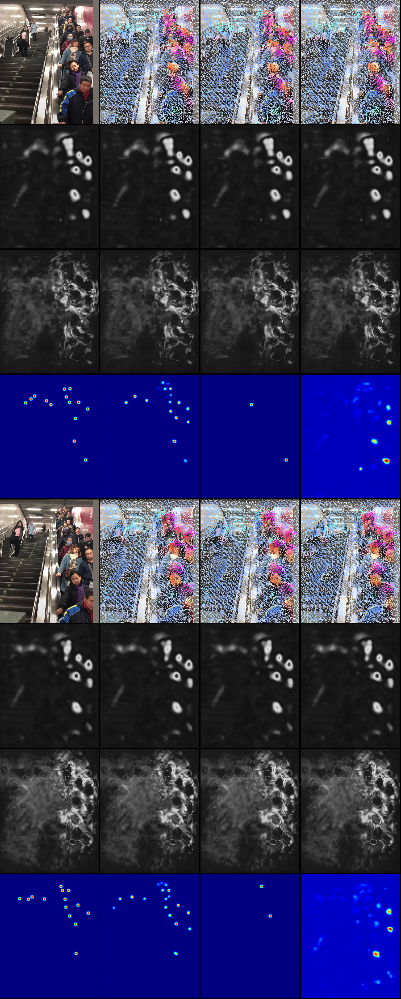

In [9]:
import numpy as np
import sys 
import torch
sys.path.append('..')
from datasets import loading_data
# from model.SMDCA import SMDCANet
from model.points_from_den import get_ROI_and_MatchInfo

from importlib import import_module
from misc.gt_generate import *



from tqdm import tqdm




device = torch.device('cpu')
# train_loader, val_loader, restore_transform = loading_data(cfg)
data_mode = dataset_name
datasetting = import_module(f'datasets.setting.{data_mode}')
cfg_data = datasetting.cfg_data
print(cfg_data)
net = SMDCANet(cfg, cfg_data)
generate_gt = GenerateGT(cfg)
generate_gt.Gaussian = generate_gt.Gaussian.to(device)
get_roi_and_matchinfo = get_ROI_and_MatchInfo( cfg.TRAIN_SIZE, cfg.ROI_RADIUS, feature_scale=cfg.feature_scale)


state_dict = torch.load(cfg.PRETRAIN_PATH, map_location=device)
            
# net.load_state_dict(state_dict, strict=True)
net.load_state_dict(state_dict['net'], strict=True)

net.eval()
i_tb =0



   

img = torch.stack(img,0)
b, c, h, w = img.shape
if h % 64 != 0: pad_h = 64 - h % 64
else: pad_h = 0
if w % 64 != 0: pad_w = 64 - w % 64
else: pad_w = 0
pad_dims = (0, pad_w, 0, pad_h)
img = F.pad(img, pad_dims, "constant")





img_pair_num = img.size(0)//2  
den, mask, pre_outflow_map, pre_inflow_map, f_flow, b_flow, feature1, feature2, attn_1, attn_2 = net(img)
# den, den_scales, mask, pre_outflow_map, pre_inflow_map, f_flow, b_flow, feature1, feature2, attn_1, attn_2 = net(img)


pre_inf_cnt, pre_out_cnt = \
            pre_inflow_map.sum(axis=2).sum(axis=2).detach(), pre_outflow_map.sum(axis=2).sum(axis=2).detach()


target_ratio = den.shape[2]/img.shape[2]

for b in range(len(target)):
    target[b]["points"] = target[b]["points"] * target_ratio
    target[b]["sigma"] = target[b]["sigma"] * target_ratio
    
    for key,data in target[b].items():
        if torch.is_tensor(data):
            target[b][key]=data 

gt_den = generate_gt.get_den(den.shape, target, 1)
        
gt_mask = torch.zeros(img_pair_num, 2, den.size(2), den.size(3)) 
assert den.size() == gt_den.size()
gt_inflow_cnt = torch.zeros(img_pair_num) 
gt_outflow_cnt = torch.zeros(img_pair_num) 
con_loss = torch.tensor([0]) 
for pair_idx in range(img_pair_num):
    count_in_pair=[target[pair_idx * 2]['points'].size(0), target[pair_idx * 2+1]['points'].size(0)]
    
    if (np.array(count_in_pair) > 0).all() and (np.array(count_in_pair) < 4000).all():
        match_gt, pois = get_roi_and_matchinfo(target[pair_idx * 2], target[pair_idx * 2+1],'ab')

        gt_mask, gt_inflow_cnt, gt_outflow_cnt \
            = generate_gt.get_io_mask(pair_idx, target, match_gt, gt_mask, gt_outflow_cnt, gt_inflow_cnt, 1)


save_results_mask(cfg, None, None, None, i_tb, restore_transform, 0, img[0].clone().unsqueeze(0), \
                                img[1].clone().unsqueeze(0), den[0].detach().cpu().numpy() , \
                                gt_den[0].detach().cpu().numpy(), den[1].detach().cpu().numpy(), gt_den[1].detach().cpu().numpy() , \
                                (mask[0,:,:,:]).detach().cpu().numpy(), gt_mask[0,0:1,:,:].detach().cpu().numpy(), \
                                (mask[img.size(0)//2,:,:,:]).detach().cpu().numpy(), gt_mask[0,1:2,:,:].detach().cpu().numpy(),\
                                    f_flow , b_flow,\
                                    attn_1, attn_2)
# for i in range(gt_den.shape[0]):
#     # multi-scale density gt
#     gt_den_np = gt_den[i].detach().cpu().numpy().squeeze()
#     den1 = gt_den_np.copy()
#     den2 = cv2.resize(gt_den_np,(int(gt_den_np.shape[1]/2),int(gt_den_np.shape[0]/2)),interpolation = cv2.INTER_CUBIC)*4
#     den3 = cv2.resize(gt_den_np,(int(gt_den_np.shape[1]/4),int(gt_den_np.shape[0]/4)),interpolation = cv2.INTER_CUBIC)*16
    

#     if i == 0:
#         dengt1 = np.expand_dims(den1,0)
#         dengt2 = np.expand_dims(den2,0)
#         dengt3 = np.expand_dims(den3,0)
        
#     else:
#         dengt1 = np.vstack((dengt1,np.expand_dims(den1,0)))
#         dengt2 = np.vstack((dengt2,np.expand_dims(den2,0)))
#         dengt3 = np.vstack((dengt3,np.expand_dims(den3,0)))
#     gt_den_scales = [torch.Tensor(dengt1[:,None,:,:]).cuda(), torch.Tensor(dengt2[:,None,:,:]).cuda(), torch.Tensor(dengt3[:,None,:,:]).cuda()]

#     b, _, h, w = gt_mask.shape
#     # mask
#     for i in range(b*2):
#         # multi-scale density gt
#         gt_mask_np = gt_mask.view(b*2,h,w)[i].detach().cpu().numpy().squeeze()
#         mask1 = gt_mask_np.copy()
#         mask2 = cv2.resize(gt_mask_np,(int(gt_mask_np.shape[1]/2),int(gt_mask_np.shape[0]/2)),interpolation = cv2.INTER_CUBIC)*4
#         mask3 = cv2.resize(gt_mask_np,(int(gt_mask_np.shape[1]/4),int(gt_mask_np.shape[0]/4)),interpolation = cv2.INTER_CUBIC)*16
#         if i == 0:
#             maskgt1 = np.expand_dims(mask1,0)
#             maskgt2 = np.expand_dims(mask2,0)
#             maskgt3 = np.expand_dims(mask3,0)
        
            
#         else:
#             maskgt1 = np.vstack((maskgt1,np.expand_dims(mask1,0)))
#             maskgt2 = np.vstack((maskgt2,np.expand_dims(mask2,0)))
#             maskgt3 = np.vstack((maskgt3,np.expand_dims(mask3,0)))
        
#     gt_mask_scales = [(torch.Tensor(maskgt1>0)).view(b,2,h,w).cuda(), (torch.Tensor(maskgt2>0)).view(b,2,h//2,w//2).cuda(), (torch.Tensor(maskgt3>0)).view(b,2,h//4,w//4).cuda()]

# save_results_mask(cfg, None, None, None, i_tb, restore_transform, 0, 
#                                   img[0].clone().unsqueeze(0), img[1].clone().unsqueeze(0), 
#                                   den[0].detach().cpu().numpy() , gt_den[0].detach().cpu().numpy(), den[1].detach().cpu().numpy(), gt_den[1].detach().cpu().numpy() , \
#                                 #   (mask[0,:,:,:]).detach().cpu().numpy(), gt_mask[0,0:1,:,:].detach().cpu().numpy(), \
#                                 #   (mask[img.size(0)//2,:,:,:]).detach().cpu().numpy(), gt_mask[0,1:2,:,:].detach().cpu().numpy(),\
#                                    f_flow , b_flow, attn_1, attn_2, den_scales, gt_den_scales, mask, gt_mask_scales)
    

In [10]:
target_ratio

0.5

In [11]:
den.shape

torch.Size([2, 1, 480, 384])

In [12]:
img.shape

torch.Size([2, 3, 960, 768])

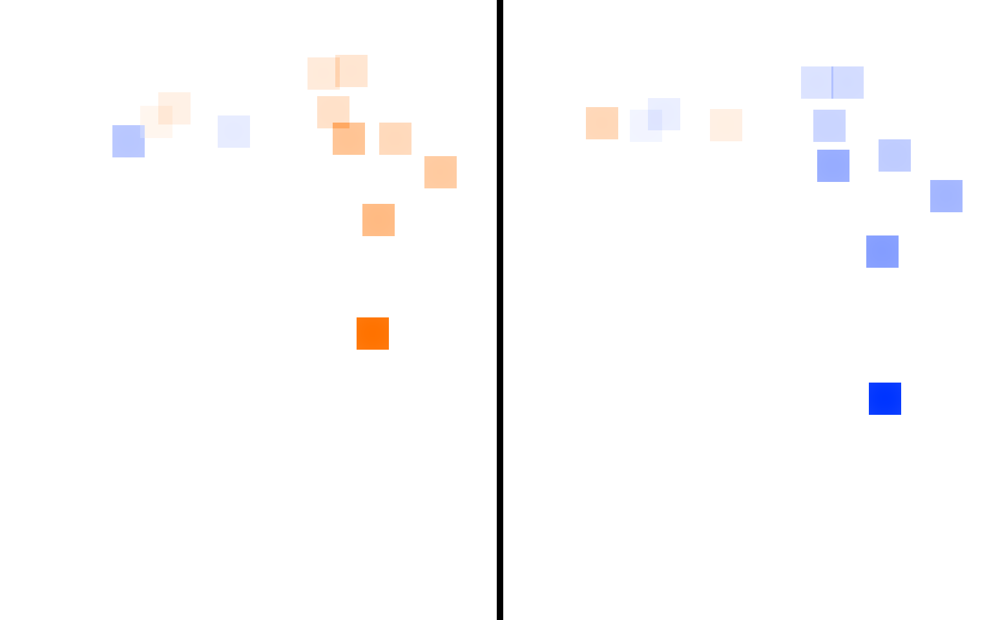

In [23]:
from misc.layer import Gaussianlayer

# offset = target[1]["points"][match_gt["a2b"][:,1]] - target[0]["points"][match_gt["a2b"][:,0]]

Gaussian = Gaussianlayer(sigma=[100],kernel_size=50)

y, x = torch.meshgrid(torch.arange(gt_den[0].shape[1]*(1/target_ratio)), torch.arange(gt_den[0].shape[2]*(1/target_ratio)))

grid_1 = torch.stack([x,y], dim=0).float()
grid_12 = torch.stack([x,y], dim=0).float()
grid_21 = torch.stack([x,y], dim=0).float()


grid_12[:,(target[0]["points"][match_gt["a2b"][:,0],1]*(1/target_ratio)).long(), (target[0]["points"][match_gt["a2b"][:,0],0]*(1/target_ratio)).long()] = (target[1]["points"][match_gt["a2b"][:,1]]*(1/target_ratio)).T
grid_21[:,(target[1]["points"][match_gt["a2b"][:,1],1]*(1/target_ratio)).long(), (target[1]["points"][match_gt["a2b"][:,1],0]*(1/target_ratio)).long()] = (target[0]["points"][match_gt["a2b"][:,0]]*(1/target_ratio)).T


# print(Gaussian((grid_2 - grid_1)).shape)
offset_12 =  torch.cat([Gaussian((grid_12 - grid_1)[None, 1,:,:])[None,:,:],Gaussian((grid_12 - grid_1)[None, 1,:,:])[None,:,:]],dim=0).squeeze()
offset_21 =  torch.cat([Gaussian((grid_21 - grid_1)[None, 1,:,:])[None,:,:],Gaussian((grid_21 - grid_1)[None, 1,:,:])[None,:,:]],dim=0).squeeze()

f_12 = (offset_12).permute(1,2,0).detach().cpu().numpy()
f_21 = (offset_21).permute(1,2,0).detach().cpu().numpy()

f_12_im = flow_to_image(f_12)
f_21_im = flow_to_image(f_21)


target_shape = (f_12.shape[1]*2 + 10, f_12.shape[0] )
flow_shape = f_12.shape

f_12_im= Image.fromarray(f_12_im)
f_21_im= Image.fromarray(f_21_im)


flows = Image.new('RGB', target_shape)

x, y = int(0%2) * (flow_shape[1] + 10), int(0 // 2) * (flow_shape[0] + 10)  # 左上角坐标，从左到右递增
flows.paste(f_12_im, (x, y, x + flow_shape[1], y + flow_shape[0]))
x, y = int(1%2) * (flow_shape[1] + 10), int(1 // 2) * (flow_shape[0] + 10)  # 左上角坐标，从左到右递增
flows.paste(f_21_im, (x, y, x + flow_shape[1], y + flow_shape[0]))

flows.show()



In [14]:
f_12.shape

(960, 768, 2)

In [15]:
gt_den[0].shape[1]*(1/target_ratio)

960.0

In [16]:
target_ratio

0.5

In [17]:
len(np.where(f_12!=0)[0])

5400

In [18]:
def point_vec(img,flow, interval, thickness=5):
    meshgrid = np.meshgrid(range(img.shape[1]),range(img.shape[0]))
    dispimg = cv2.resize(img, None,fx=4,fy=4)
    # dispimg = img

    colorflow = flow_to_image(flow).astype(int)
    for i in range(img.shape[1]): # x 
        for j in range(img.shape[0]): # y
            # if flow[j,i,2] != 1: continue
            if j%interval!=0 or i%interval!=0: continue
            xend = int((meshgrid[0][j,i]+flow[j,i,0])*4)
            yend = int((meshgrid[1][j,i]+flow[j,i,1])*4)
            leng = np.linalg.norm(flow[j,i,:2])
            if leng<1:continue
            dispimg = cv2.arrowedLine(dispimg, (meshgrid[0][j,i]*4,meshgrid[1][j,i]*4),\
                                      (xend,yend),
                                      (int(colorflow[j,i,2]),int(colorflow[j,i,1]),int(colorflow[j,i,0])),thickness,tipLength=8/leng,line_type=cv2.LINE_AA)
    dispimg = cv2.resize(dispimg,None,fx=1/4,fy=1/4)
    return dispimg  

(-0.5, 767.5, 959.5, -0.5)

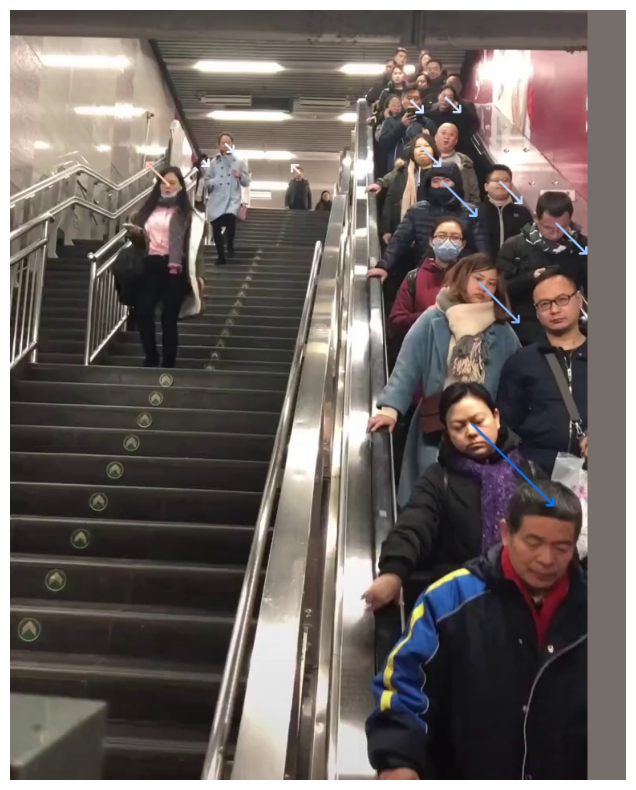

In [19]:
import matplotlib.pyplot as plt

offset_12 =  torch.cat([((grid_12 - grid_1)[None, 1,:,:])[None,:,:],((grid_12 - grid_1)[None, 1,:,:])[None,:,:]],dim=0).squeeze()
offset_21 =  torch.cat([((grid_21 - grid_1)[None, 1,:,:])[None,:,:],((grid_21 - grid_1)[None, 1,:,:])[None,:,:]],dim=0).squeeze()
f_12 = (offset_12).permute(1,2,0).detach().cpu().numpy()
f_21 = (offset_21).permute(1,2,0).detach().cpu().numpy()

img1 = np.array(restore_transform(img[0].clone()))
dispimg = point_vec(img1,f_12,1,10)
plt.figure(figsize=(10,10))
plt.imshow(dispimg)
plt.axis('off')


(-0.5, 767.5, 959.5, -0.5)

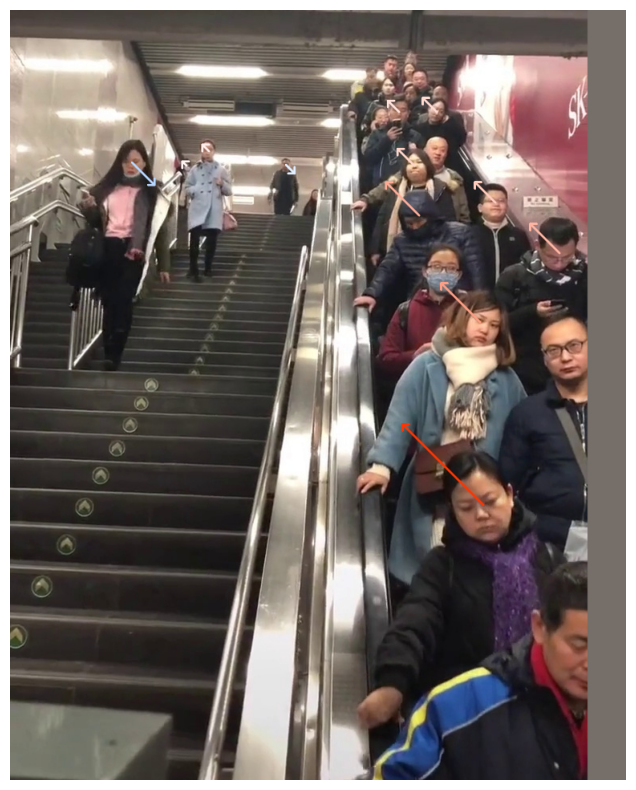

In [20]:


img2 = np.array(restore_transform(img[1].clone()))
dispimg = point_vec(img2,f_21,1,10)
plt.figure(figsize=(10,10))
plt.imshow(dispimg)
plt.axis('off')
